##**AWOL per Pixel Art:**
  *Mappare Descrizioni Testuali su Parametri di Generazione di Pixel Art*

In [2]:
# import
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from transformers import CLIPProcessor, CLIPModel
import numpy as np
from PIL import Image
import kagglehub
import os
import numpy as np
import pandas as pd
import io
from PIL import Image
import matplotlib.pyplot as plt
import ast
from IPython.display import Image as IPyImage, display, HTML
import base64
import torchvision.transforms as transforms

In [3]:
# Download latest version
path = kagglehub.dataset_download("thedevastator/pokemon-llava-images-and-text-descriptions")

print("Path to dataset files:", path)

Path to dataset files: /kaggle/input/pokemon-llava-images-and-text-descriptions


In [4]:
print("Contenuto del dataset:")
print(os.listdir(path))

Contenuto del dataset:
['train.csv']


In [5]:
# Carica il CSV
csv_path = os.path.join(path, "train.csv")
df = pd.read_csv(csv_path)

len(df)

833

In [6]:
print(df.head())

                                               image  \
0  {'bytes': b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHD...   
1  {'bytes': b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHD...   
2  {'bytes': b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHD...   
3  {'bytes': b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHD...   
4  {'bytes': b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHD...   

                                                text  
0  A cartoon drawing of a green Pokemon with a le...  
1  A cartoon character with a red face and a gree...  
2  A cartoon character with a red face and white ...  
3  A white and pink cartoon character with a smil...  
4  A group of cartoon characters with different e...  


In [7]:
# Funzione per veder immmagini
def bytes_to_image(byte_data):
    return Image.open(io.BytesIO(byte_data))

In [8]:
# Visualizza le prime n immagini con descrizioni
def display_images(df, num_images=5):
    plt.figure(figsize=(15, num_images * 3))
    for i in range(min(num_images, len(df))):
        try:
            # estrae immagine dal dizionario
            img_dict = df.iloc[i]['image']
            if isinstance(img_dict, dict) and 'bytes' in img_dict:
                img_bytes = img_dict['bytes']  # Access the 'bytes' field
            else:
                print(f"Error: Image {i} is not in expected dictionary format")
                continue

            img = bytes_to_image(img_bytes)

            # estrae la descrizione
            text = df.iloc[i]['text']

            # Crea subplot
            plt.subplot(num_images, 1, i + 1)
            plt.imshow(img)
            plt.title(f"Description: {text}", fontsize=10)
            plt.axis('off')
        except Exception as e:
            print(f"Error processing image {i}: {e}")
            continue

    plt.tight_layout()
    plt.show()

In [9]:
# Visualizza le prime 5 immagini
display_images(df, num_images=1)

Error: Image 0 is not in expected dictionary format


<Figure size 1500x300 with 0 Axes>

In [10]:
df.iloc[0]["image"]

'{\'bytes\': b\'\\x89PNG\\r\\n\\x1a\\n\\x00\\x00\\x00\\rIHDR\\x00\\x00\\x05\\x00\\x00\\x00\\x05\\x00\\x08\\x02\\x00\\x00\\x00\\x97\\x86h\\xa0\\x00\\x00\\n0iCCPICC Profile\\x00\\x00x\\x9c\\x9d\\x96wTT\\xd7\\x16\\x87\\xcf\\xbdwz\\xa1\\xcd0\\x14)C\\xef\\xbd\\r \\xbd7\\xa9\\xd2Da\\x98\\x19`(\\x03\\x0e34\\xb1!\\xa2\\x02\\x11ED\\x04\\x15A\\x82"\\x06\\x8c\\x86"\\xb1"\\x8a\\x85\\x80`\\xc1\\x1e\\x90 \\xa0\\xc4`\\x14QQy3\\xb2Vt\\xe5\\xe5\\xbd\\x97\\x97\\xdf\\x1fg}k\\x9f\\xbd\\xf7=g\\xef}\\xd6\\xba\\x00\\x90\\xbc\\xfd\\xb9\\xbctX\\n\\x804\\x9e\\x80\\x1f\\xe2\\xe5J\\x8f\\x8c\\x8a\\xa6c\\xfb\\x01\\x0c\\xf0\\x00\\x03\\xcc\\x00`\\xb223\\x02B=\\xc3\\x80H>\\x1en\\xf4L\\x91\\x13\\xf8"\\x08\\x807w\\xc4+\\x007\\x8d\\xbc\\x83\\xe8t\\xf0\\xffI\\x9a\\x95\\xc1\\x17\\x88\\xd2\\x04\\x89\\xd8\\x82\\xcd\\xc9d\\x89\\xb8P\\xc4\\xa9\\xd9\\x82\\x0c\\xb1}F\\xc4\\xd4\\xf8\\x141\\xc3(1\\xf3E\\x07\\x14\\xb1\\xbc\\x98\\x13\\x17\\xd9\\xf0\\xb3\\xcf";\\x8b\\x99\\x9d\\xc6c\\x8bX|\\xe6\\x0cv\\x1a[\\xcc="\\xde\\x9a%\\xe4\\x88\

In [11]:
type(df.iloc[0]["image"])

str

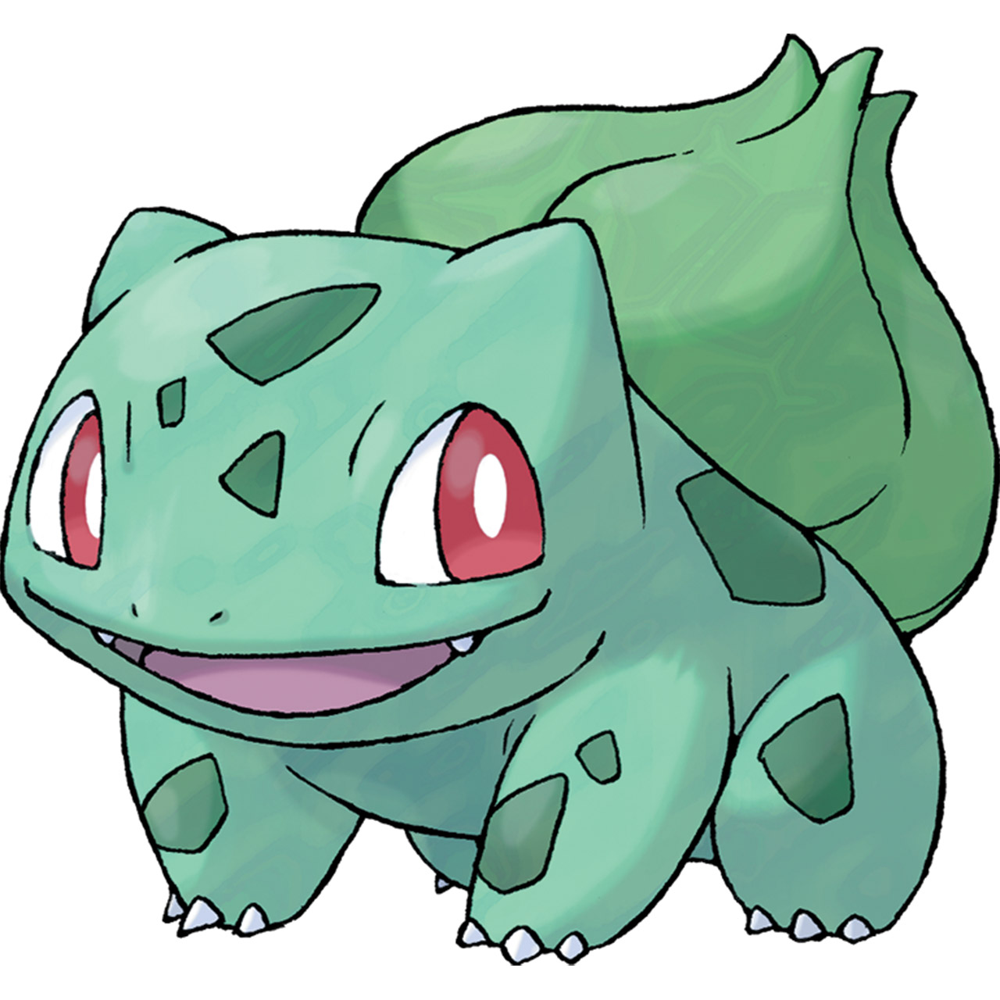

In [12]:
# Estrae il dizionario dalla stringa
image_str = df.iloc[0]["image"]
image_dict = ast.literal_eval(image_str)

# Prende i byte
image_bytes = image_dict['bytes']

# Carica l'immagine
image = Image.open(io.BytesIO(image_bytes))

# Visualizza l'immagine
display(IPyImage(data=image_bytes, width=300))

In [13]:
df.iloc[0]["text"]

'A cartoon drawing of a green Pokemon with a leaf on its back.'

In [14]:
def mostra_immagini_con_descrizione(df, indici, width=300):
    html_output = ""

    for i in indici:
        # Estrae immagine
        image_str = df.iloc[i]["image"]
        image_dict = ast.literal_eval(image_str)
        image_bytes = image_dict['bytes']

        # Codifica in base64 per HTML
        encoded = base64.b64encode(image_bytes).decode()

        # Estrae descrizione
        descrizione = df.iloc[i]["text"]

        # Blocchetto HTML
        html_output += f"""
        <div style="display:inline-block; text-align:center; margin:10px">
            <img src="data:image/png;base64,{encoded}" width="{width}"><br>
            <div style="width:{width}px; white-space:normal">{descrizione}</div>
        </div>
        """

    display(HTML(html_output))


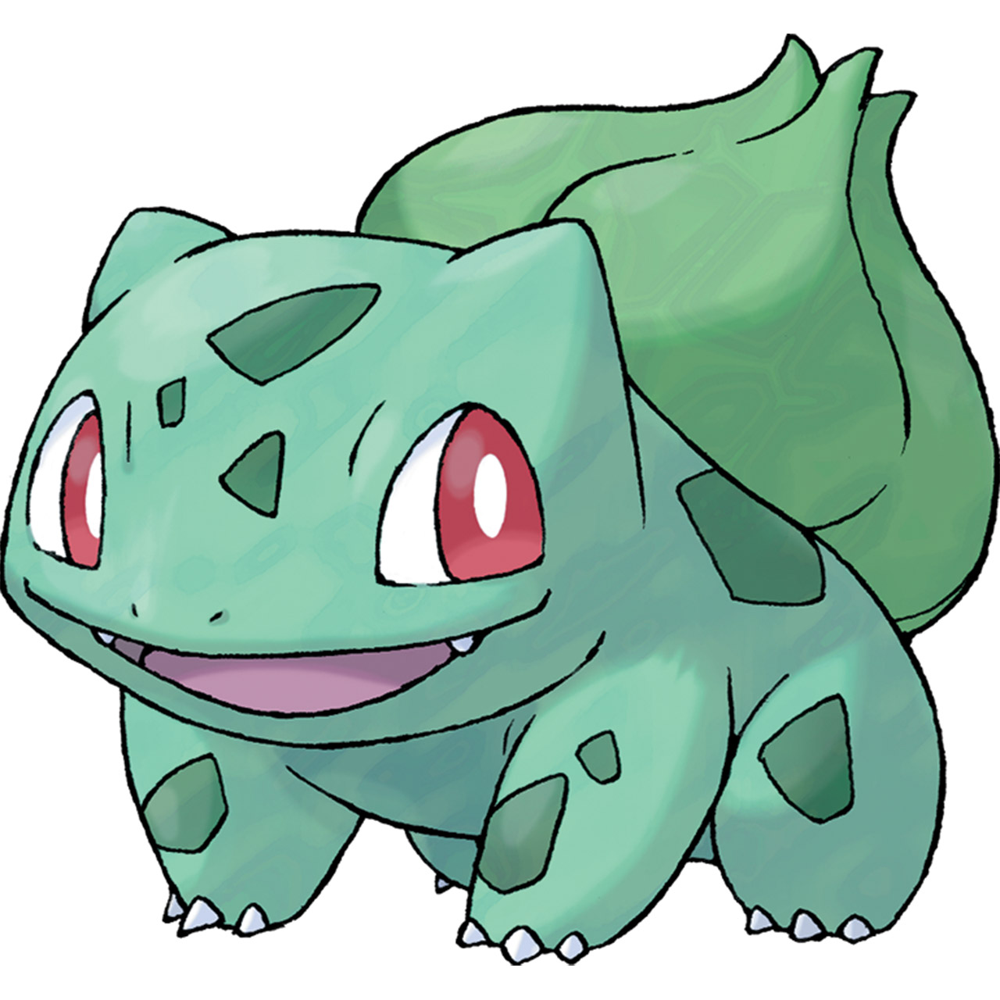
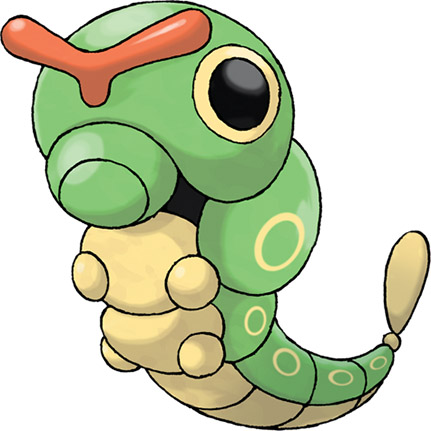
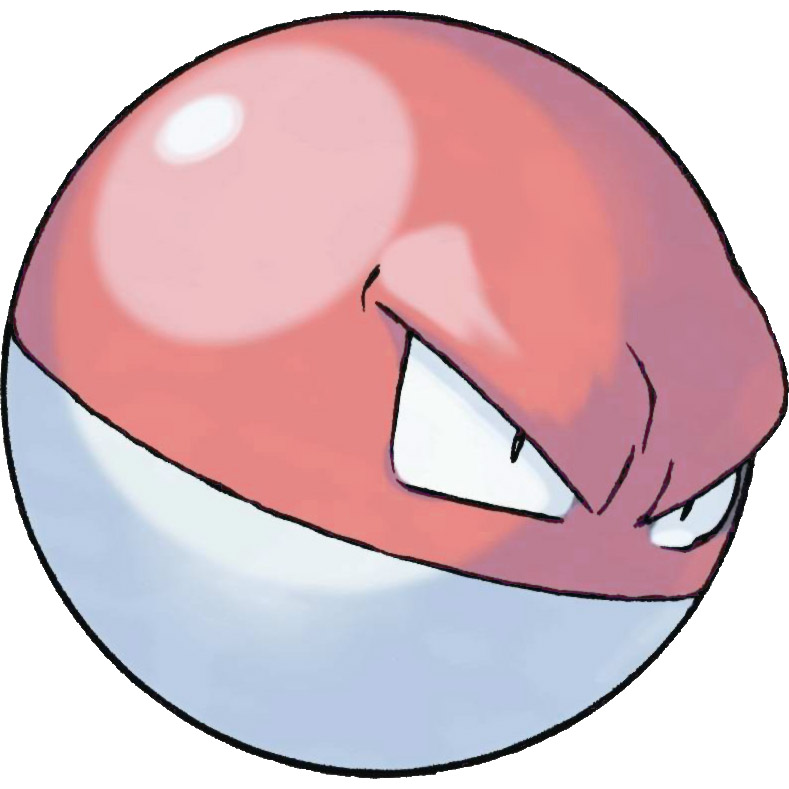
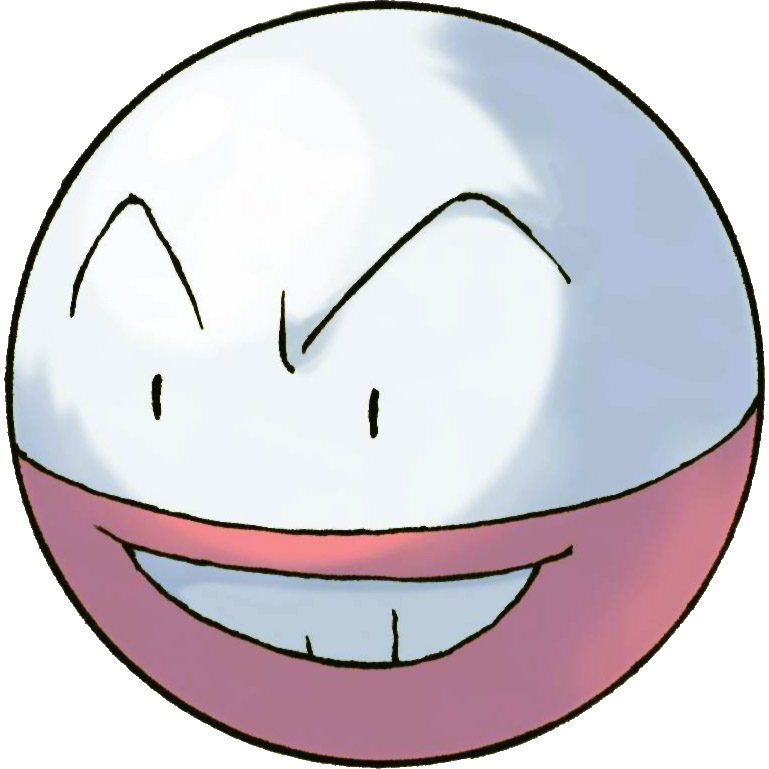
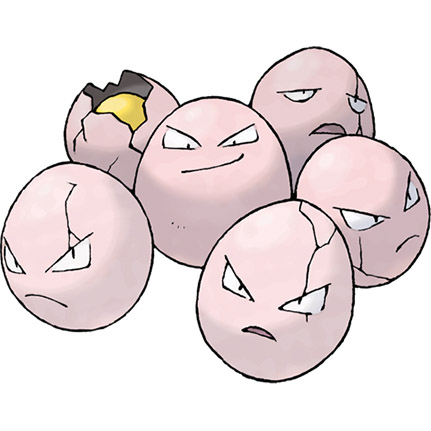
...
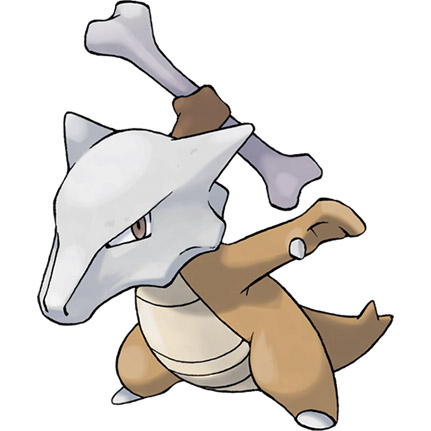
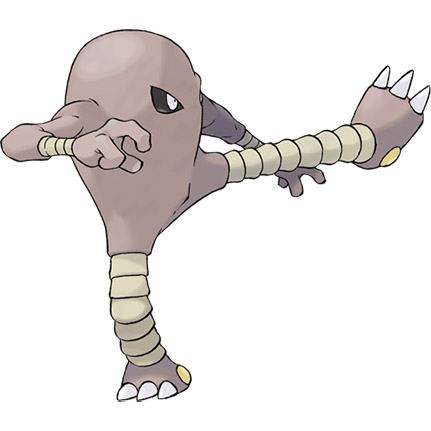
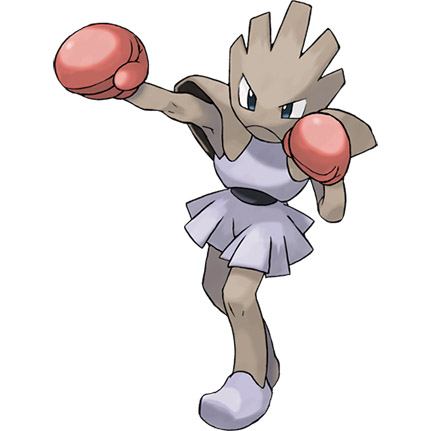
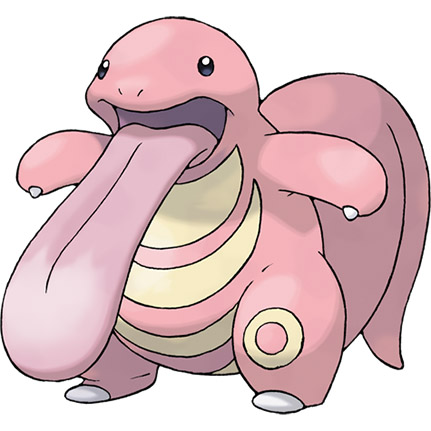
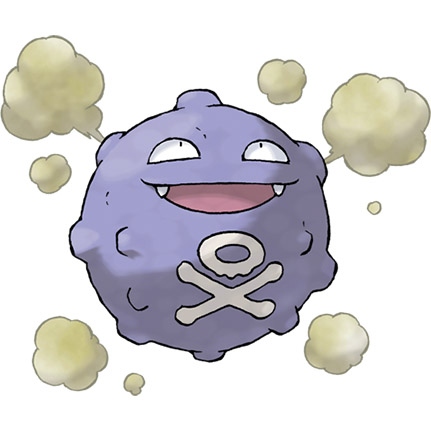

In [15]:
mostra_immagini_con_descrizione(df, [0, 1, 2,3,4,5,6,7,8,9,10,11], width=200)

In [16]:
img_dict = ast.literal_eval(df.iloc[0]['image'])
img = Image.open(io.BytesIO(img_dict['bytes']))
print(f"Risoluzione immagine: {img.size}")

Risoluzione immagine: (1280, 1280)


In [17]:
def mostra_immagini_con_descrizione_rid(df, indici, width=200, target_size=(32, 32)):
    html_output = ""

    for i in indici:
        try:
            # Estrae immagine
            image_str = df.iloc[i]["image"]
            image_dict = ast.literal_eval(image_str)
            image_bytes = image_dict['bytes']

            # Converte in immagine PIL e ridimensiona
            img = Image.open(io.BytesIO(image_bytes)).convert('RGB')
            img = img.resize(target_size, Image.Resampling.NEAREST)  # NEAREST per pixel art

            # Codifica in base64 per HTML
            buffered = io.BytesIO()
            img.save(buffered, format="PNG")
            encoded = base64.b64encode(buffered.getvalue()).decode()

            # Estrae descrizione
            descrizione = df.iloc[i]["text"]

            # Blocchetto HTML
            html_output += f"""
            <div style="display:inline-block; text-align:center; margin:10px">
                <img src="data:image/png;base64,{encoded}" width="{width}"><br>
                <div style="width:{width}px; white-space:normal">{descrizione}</div>
            </div>
            """
        except Exception as e:
            print(f"Errore nel processare immagine {i}: {e}")
            continue

    display(HTML(html_output))


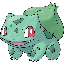
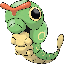
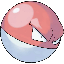
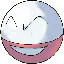
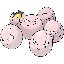
...
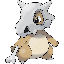
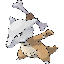
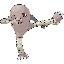
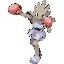
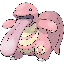

In [18]:
# Visualizza le prime 11 immagini ridimensionate
mostra_immagini_con_descrizione_rid(df, [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10], width=200, target_size=(64, 64))

In [19]:
import warnings
warnings.filterwarnings('ignore')

# ————— Dataset & CLIP setup —————
clip_processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")
clip_model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32").cuda()


Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


preprocessor_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

pytorch_model.bin:   0%|          | 0.00/605M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/605M [00:00<?, ?B/s]

In [20]:
transform = transforms.Compose([
    transforms.Resize((64, 64), interpolation=transforms.InterpolationMode.NEAREST),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5]*3, std=[0.5]*3)  # → [-1, 1]
])


---

In [21]:
# ————— Reti: Generator, Flow, Main Model

class PixelArtGenerator(nn.Module):
    def __init__(self, param_dim=128, image_size=64):
        super().__init__()
        self.fc = nn.Linear(param_dim, 1024 * 4 * 4)

        self.deconv = nn.Sequential(
            nn.ReLU(),
            nn.Unflatten(1, (1024, 4, 4)),
            nn.ConvTranspose2d(1024, 512, 4, stride=2, padding=1),  # 8x8
            nn.BatchNorm2d(512, momentum = 0.1),
            nn.ReLU(),
            nn.ConvTranspose2d(512, 256, 4, stride=2, padding=1),   # 16x16
            nn.BatchNorm2d(256, momentum = 0.1),
            nn.ReLU(),
            nn.ConvTranspose2d(256, 128, 4, stride=2, padding=1),   # 32x32
            nn.BatchNorm2d(128, momentum = 0.1),
            nn.ReLU(),
            nn.ConvTranspose2d(128, 64, 4, stride=2, padding=1),    # 64x64
            nn.BatchNorm2d(64, momentum = 0.1),
            nn.ReLU(),
            nn.Conv2d(64, 3, 3, stride=1, padding=1),
            nn.Tanh()  # Output in range [-1, 1]
        )

    def forward(self, params):
        x = self.fc(params)
        return self.deconv(x)

class RealNVP(nn.Module):
    def __init__(self, input_dim, hidden_dim=128, num_layers=3):
        super().__init__()
        self.scale_nets = nn.ModuleList([
            nn.Sequential(nn.Linear(input_dim, hidden_dim), nn.ReLU(),
                          nn.Linear(hidden_dim, input_dim), nn.Tanh())
            for _ in range(num_layers)
        ])
        self.translate_nets = nn.ModuleList([
            nn.Sequential(nn.Linear(input_dim, hidden_dim), nn.ReLU(),
                          nn.Linear(hidden_dim, input_dim))
            for _ in range(num_layers)
        ])
        # Maschere fisse invece di parametri learnable
        self.masks = []
        for i in range(num_layers):
            mask = torch.zeros(input_dim)
            mask[i % 2::2] = 1  # Alterna ogni 2 elementi
            self.masks.append(mask)

    def forward(self, z):
        log_det = torch.zeros(z.size(0), device=z.device)
        x = z
        for i in range(len(self.masks)):
            mask = self.masks[i].to(z.device)
            x_m = x * mask
            s = self.scale_nets[i](x_m)
            t = self.translate_nets[i](x_m)
            x = x_m + (1 - mask) * (x * torch.exp(s) + t)
            log_det += torch.sum((1 - mask) * s, dim=1)
        return x, log_det

class AWOLPixelArt(nn.Module):
    def __init__(self, param_dim=128):
        super().__init__()
        self.flow = RealNVP(512, hidden_dim=256, num_layers=4)
        self.param_mapper = nn.Sequential(
            nn.Linear(512, 256),
            nn.ReLU(),
            nn.Linear(256, param_dim)
        )
        self.generator = PixelArtGenerator(param_dim=param_dim)

    def forward(self, text_embeddings):
        # Passa attraverso il flow
        flow_out, _ = self.flow(text_embeddings)

        # Mappa ai parametri del generatore
        params = self.param_mapper(flow_out)

        # Genera l'immagine
        return self.generator(params)


In [22]:
# ————— Dataset loader —————
def prepare_dataset(df, max_samples=None):
    images, embeddings, texts = [], [], []

    for i, row in df.iterrows():
        if max_samples is not None and len(images) >= max_samples:
            break

        try:
            img_dict = eval(row['image'])
            img_bytes = img_dict['bytes']
            if isinstance(img_bytes, str):
                img_bytes = eval(img_bytes)
            img = Image.open(io.BytesIO(img_bytes)).convert('RGB')
            img_tensor = transform(img)
            images.append(img_tensor)

            inputs = clip_processor(text=[row['text']], return_tensors="pt", padding=True).to("cuda")
            with torch.no_grad():
                emb = clip_model.get_text_features(**inputs).squeeze(0)
            embeddings.append(emb)
            texts.append(row['text'])
        except Exception as e:
            continue

    assert images, "Nessuna immagine valida!"
    return torch.stack(images), torch.stack(embeddings), texts




In [23]:
# ————— Loss & Preview functions —————
def resize_and_normalize_for_clip(images):
    resized = F.interpolate(images, size=(224, 224), mode='bilinear', align_corners=False)
    return transforms.Normalize(mean=[0.48145466,0.4578275,0.40821073],
                                std=[0.26862954,0.26130258,0.27577711])(resized)

def compute_clip_loss(generated_images, texts):
    gi = resize_and_normalize_for_clip(generated_images)
    inputs = clip_processor(text=texts, return_tensors="pt", padding=True, truncation=True).to("cuda")
    with torch.no_grad():
        img_f = clip_model.get_image_features(pixel_values=gi)
        txt_f = clip_model.get_text_features(**inputs)
    img_f, txt_f = F.normalize(img_f, dim=1), F.normalize(txt_f, dim=1)
    sim = torch.cosine_similarity(img_f, txt_f, dim=1)
    return (1-sim).mean(), sim.mean().item()

def show_sample_images(epoch, generated, real, n=4):
    def denorm(t): return t.mul(0.5).add(0.5).clamp(0,1)
    gen, re = denorm(generated[:n]).cpu(), denorm(real[:n]).cpu()
    print(f"Epoca {epoch+1}: Gen min/max/mean = {gen.min():.3f}/{gen.max():.3f}/{gen.mean():.3f}")
    print(f"Epoca {epoch+1}: Real min/max/mean= {re.min():.3f}/{re.max():.3f}/{re.mean():.3f}")
    fig, ax = plt.subplots(2, n, figsize=(n*2,4))
    for i in range(n):
        ax[0,i].imshow(re[i].permute(1,2,0))
        ax[0,i].axis('off')
        ax[0,i].set_title("Real")
        ax[1,i].imshow(gen[i].permute(1,2,0))
        ax[1,i].axis('off')
        ax[1,i].set_title("Generated")
    plt.suptitle(f"Epoch {epoch+1}")
    plt.tight_layout()
    plt.show()


Dataset: torch.Size([833, 3, 64, 64]) torch.Size([833, 512])
Epoch 1/100: MSE 0.2148, CLIP 0.8090, Cos 0.191
Epoch 2/100: MSE 0.1908, CLIP 0.8267, Cos 0.173
Epoch 3/100: MSE 0.1709, CLIP 0.8210, Cos 0.179
Epoch 4/100: MSE 0.1441, CLIP 0.8067, Cos 0.193
Epoch 5/100: MSE 0.1268, CLIP 0.7918, Cos 0.208
Epoch 6/100: MSE 0.1149, CLIP 0.7787, Cos 0.221
Epoch 7/100: MSE 0.1048, CLIP 0.7717, Cos 0.228
Epoch 8/100: MSE 0.0944, CLIP 0.7681, Cos 0.232
Epoch 9/100: MSE 0.0842, CLIP 0.7611, Cos 0.239
Epoch 10/100: MSE 0.0770, CLIP 0.7455, Cos 0.254
Epoca 10: Gen min/max/mean = 0.353/0.996/0.809
Epoca 10: Real min/max/mean= 0.000/1.000/0.762


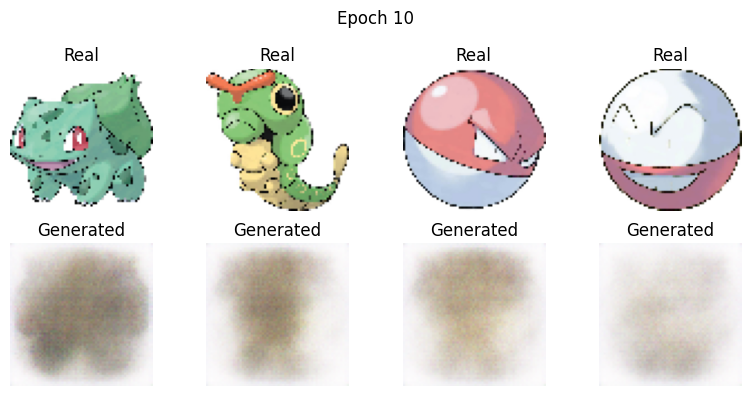

Epoch 11/100: MSE 0.0769, CLIP 0.7527, Cos 0.247
Epoch 12/100: MSE 0.0831, CLIP 0.7437, Cos 0.256
Epoch 13/100: MSE 0.0824, CLIP 0.7524, Cos 0.248
Epoch 14/100: MSE 0.0604, CLIP 0.7369, Cos 0.263
Epoch 15/100: MSE 0.0512, CLIP 0.7348, Cos 0.265
Epoch 16/100: MSE 0.0452, CLIP 0.7303, Cos 0.270
Epoch 17/100: MSE 0.0422, CLIP 0.7192, Cos 0.281
Epoch 18/100: MSE 0.0428, CLIP 0.7291, Cos 0.271
Epoch 19/100: MSE 0.0435, CLIP 0.7312, Cos 0.269
Epoch 20/100: MSE 0.0400, CLIP 0.7324, Cos 0.268
Epoca 20: Gen min/max/mean = 0.358/0.998/0.876
Epoca 20: Real min/max/mean= 0.000/1.000/0.762


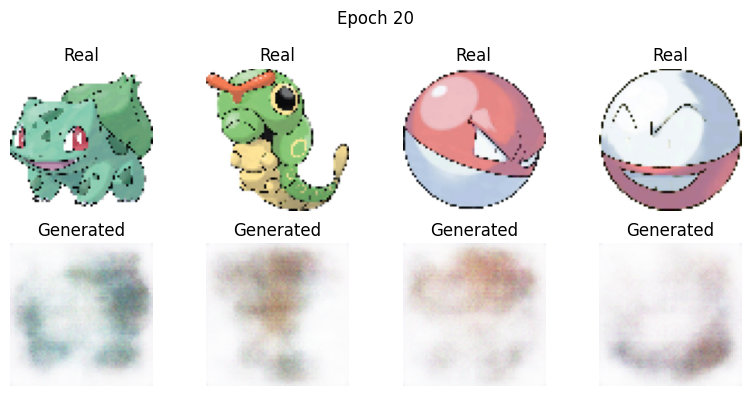

Epoch 21/100: MSE 0.0360, CLIP 0.7299, Cos 0.270
Epoch 22/100: MSE 0.0344, CLIP 0.7299, Cos 0.270
Epoch 23/100: MSE 0.0334, CLIP 0.7346, Cos 0.265
Epoch 24/100: MSE 0.0324, CLIP 0.7371, Cos 0.263
Epoch 25/100: MSE 0.0274, CLIP 0.7393, Cos 0.261
Epoch 26/100: MSE 0.0262, CLIP 0.7278, Cos 0.272
Epoch 27/100: MSE 0.0227, CLIP 0.7471, Cos 0.253
Epoch 28/100: MSE 0.0205, CLIP 0.7299, Cos 0.270
Epoch 29/100: MSE 0.0207, CLIP 0.7393, Cos 0.261
Epoch 30/100: MSE 0.0218, CLIP 0.7446, Cos 0.255
Epoca 30: Gen min/max/mean = 0.201/0.997/0.769
Epoca 30: Real min/max/mean= 0.000/1.000/0.762


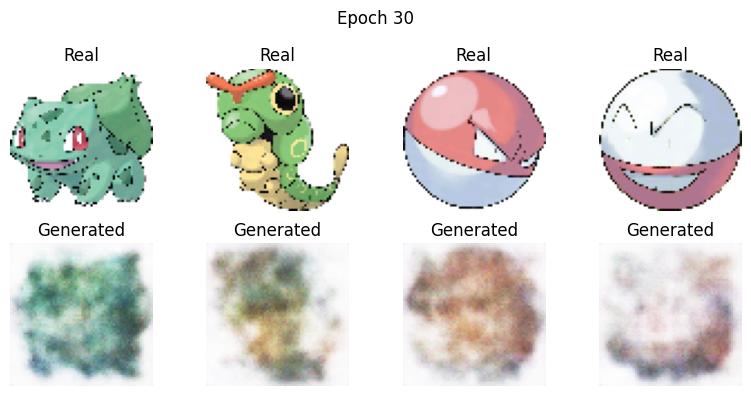

Epoch 31/100: MSE 0.0216, CLIP 0.7416, Cos 0.258
Epoch 32/100: MSE 0.0215, CLIP 0.7528, Cos 0.247
Epoch 33/100: MSE 0.0204, CLIP 0.7579, Cos 0.242
Epoch 34/100: MSE 0.0183, CLIP 0.7508, Cos 0.249
Epoch 35/100: MSE 0.0151, CLIP 0.7484, Cos 0.252
Epoch 36/100: MSE 0.0136, CLIP 0.7512, Cos 0.249
Epoch 37/100: MSE 0.0120, CLIP 0.7528, Cos 0.247
Epoch 38/100: MSE 0.0118, CLIP 0.7484, Cos 0.252
Epoch 39/100: MSE 0.0130, CLIP 0.7479, Cos 0.252
Epoch 40/100: MSE 0.0119, CLIP 0.7382, Cos 0.262
Epoca 40: Gen min/max/mean = 0.176/1.000/0.822
Epoca 40: Real min/max/mean= 0.000/1.000/0.762


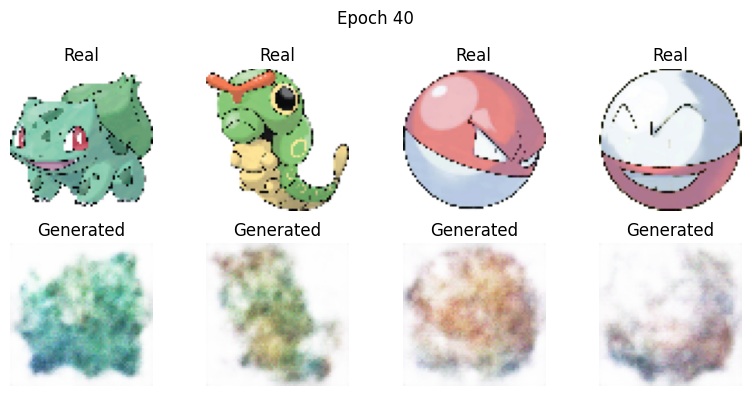

Epoch 41/100: MSE 0.0104, CLIP 0.7480, Cos 0.252
Epoch 42/100: MSE 0.0100, CLIP 0.7597, Cos 0.240
Epoch 43/100: MSE 0.0101, CLIP 0.7426, Cos 0.257
Epoch 44/100: MSE 0.0091, CLIP 0.7502, Cos 0.250
Epoch 45/100: MSE 0.0084, CLIP 0.7495, Cos 0.251
Epoch 46/100: MSE 0.0084, CLIP 0.7593, Cos 0.241
Epoch 47/100: MSE 0.0081, CLIP 0.7508, Cos 0.249
Epoch 48/100: MSE 0.0076, CLIP 0.7580, Cos 0.242
Epoch 49/100: MSE 0.0080, CLIP 0.7455, Cos 0.254
Epoch 50/100: MSE 0.0079, CLIP 0.7550, Cos 0.245
Epoca 50: Gen min/max/mean = 0.116/1.000/0.755
Epoca 50: Real min/max/mean= 0.000/1.000/0.762


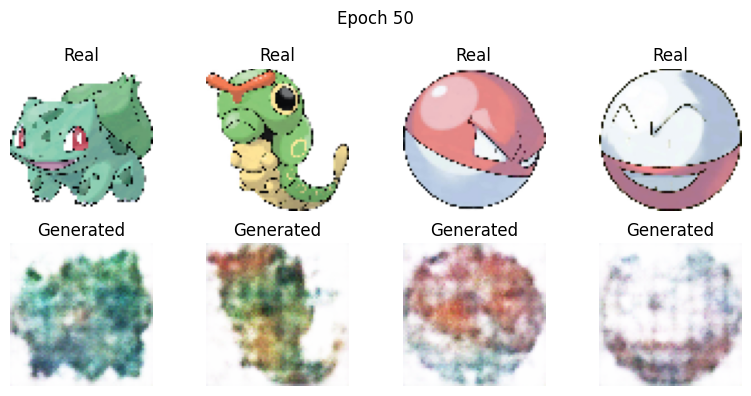

Epoch 51/100: MSE 0.0075, CLIP 0.7602, Cos 0.240
Epoch 52/100: MSE 0.0062, CLIP 0.7545, Cos 0.245
Epoch 53/100: MSE 0.0062, CLIP 0.7515, Cos 0.248
Epoch 54/100: MSE 0.0055, CLIP 0.7521, Cos 0.248
Epoch 55/100: MSE 0.0054, CLIP 0.7601, Cos 0.240
Epoch 56/100: MSE 0.0047, CLIP 0.7501, Cos 0.250
Epoch 57/100: MSE 0.0048, CLIP 0.7502, Cos 0.250
Epoch 58/100: MSE 0.0051, CLIP 0.7439, Cos 0.256
Epoch 59/100: MSE 0.0055, CLIP 0.7577, Cos 0.242
Epoch 60/100: MSE 0.0053, CLIP 0.7469, Cos 0.253
Epoca 60: Gen min/max/mean = 0.087/1.000/0.782
Epoca 60: Real min/max/mean= 0.000/1.000/0.762


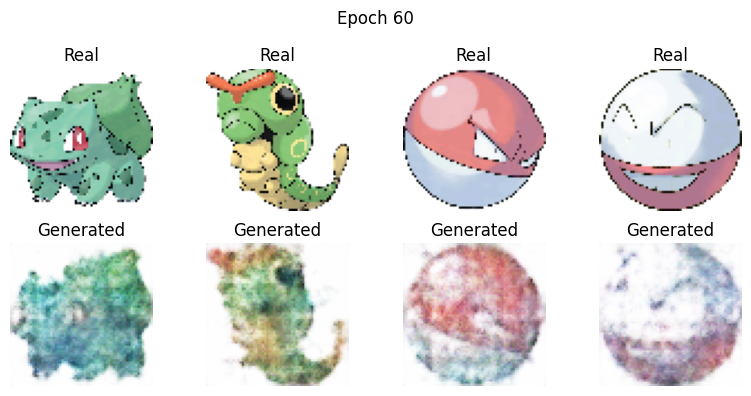

Epoch 61/100: MSE 0.0050, CLIP 0.7567, Cos 0.243
Epoch 62/100: MSE 0.0052, CLIP 0.7564, Cos 0.244
Epoch 63/100: MSE 0.0053, CLIP 0.7570, Cos 0.243
Epoch 64/100: MSE 0.0049, CLIP 0.7536, Cos 0.246
Epoch 65/100: MSE 0.0047, CLIP 0.7600, Cos 0.240
Epoch 66/100: MSE 0.0041, CLIP 0.7489, Cos 0.251
Epoch 67/100: MSE 0.0040, CLIP 0.7519, Cos 0.248
Epoch 68/100: MSE 0.0041, CLIP 0.7524, Cos 0.248
Epoch 69/100: MSE 0.0044, CLIP 0.7545, Cos 0.246
Epoch 70/100: MSE 0.0043, CLIP 0.7514, Cos 0.249
Epoca 70: Gen min/max/mean = 0.037/1.000/0.750
Epoca 70: Real min/max/mean= 0.000/1.000/0.762


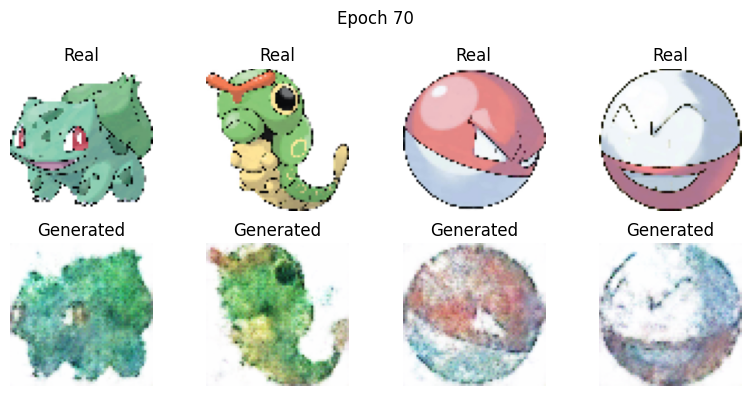

Epoch 71/100: MSE 0.0038, CLIP 0.7405, Cos 0.259
Epoch 72/100: MSE 0.0035, CLIP 0.7445, Cos 0.256
Epoch 73/100: MSE 0.0039, CLIP 0.7487, Cos 0.251
Epoch 74/100: MSE 0.0041, CLIP 0.7468, Cos 0.253
Epoch 75/100: MSE 0.0050, CLIP 0.7428, Cos 0.257
Epoch 76/100: MSE 0.0052, CLIP 0.7451, Cos 0.255
Epoch 77/100: MSE 0.0044, CLIP 0.7430, Cos 0.257
Epoch 78/100: MSE 0.0036, CLIP 0.7475, Cos 0.252
Epoch 79/100: MSE 0.0038, CLIP 0.7479, Cos 0.252
Epoch 80/100: MSE 0.0042, CLIP 0.7453, Cos 0.255
Epoca 80: Gen min/max/mean = 0.057/1.000/0.788
Epoca 80: Real min/max/mean= 0.000/1.000/0.762


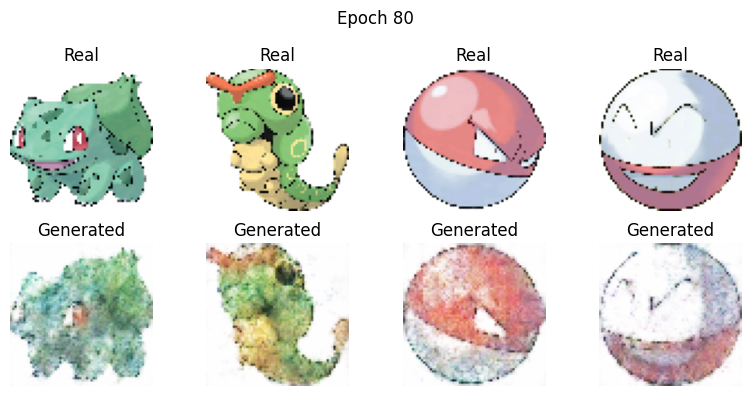

Epoch 81/100: MSE 0.0042, CLIP 0.7470, Cos 0.253
Epoch 82/100: MSE 0.0049, CLIP 0.7437, Cos 0.256
Epoch 83/100: MSE 0.0046, CLIP 0.7501, Cos 0.250
Epoch 84/100: MSE 0.0047, CLIP 0.7460, Cos 0.254
Epoch 85/100: MSE 0.0045, CLIP 0.7522, Cos 0.248
Epoch 86/100: MSE 0.0044, CLIP 0.7468, Cos 0.253
Epoch 87/100: MSE 0.0045, CLIP 0.7498, Cos 0.250
Epoch 88/100: MSE 0.0042, CLIP 0.7514, Cos 0.249
Epoch 89/100: MSE 0.0040, CLIP 0.7452, Cos 0.255
Epoch 90/100: MSE 0.0041, CLIP 0.7529, Cos 0.247
Epoca 90: Gen min/max/mean = 0.024/1.000/0.805
Epoca 90: Real min/max/mean= 0.000/1.000/0.762


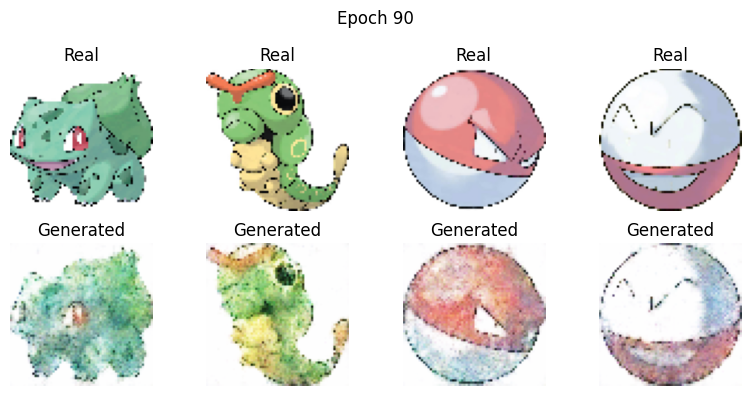

Epoch 91/100: MSE 0.0037, CLIP 0.7472, Cos 0.253
Epoch 92/100: MSE 0.0041, CLIP 0.7513, Cos 0.249
Epoch 93/100: MSE 0.0038, CLIP 0.7404, Cos 0.260
Epoch 94/100: MSE 0.0033, CLIP 0.7484, Cos 0.252
Epoch 95/100: MSE 0.0031, CLIP 0.7381, Cos 0.262
Epoch 96/100: MSE 0.0030, CLIP 0.7390, Cos 0.261
Epoch 97/100: MSE 0.0034, CLIP 0.7440, Cos 0.256
Epoch 98/100: MSE 0.0033, CLIP 0.7427, Cos 0.257
Epoch 99/100: MSE 0.0033, CLIP 0.7408, Cos 0.259
Epoch 100/100: MSE 0.0029, CLIP 0.7378, Cos 0.262
Epoca 100: Gen min/max/mean = 0.019/1.000/0.774
Epoca 100: Real min/max/mean= 0.000/1.000/0.762


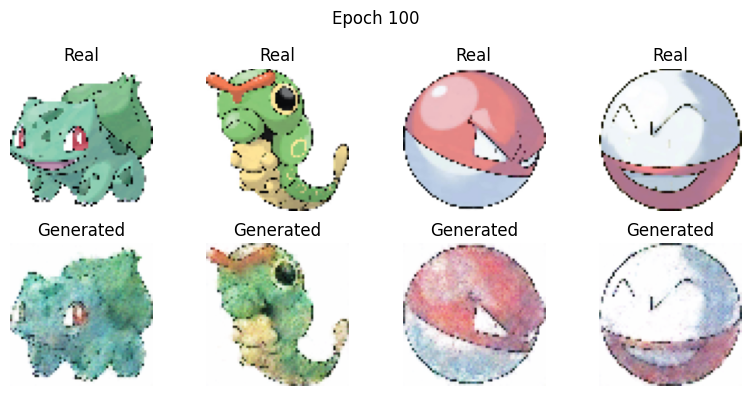

Training completato!


In [24]:
# ————— RUN: load data, train, preview —————
images, embeddings, texts = prepare_dataset(df)  # Usa tutto il dataset
print("Dataset:", images.shape, embeddings.shape)

model = AWOLPixelArt().cuda()
opt = optim.Adam(model.parameters(), lr=1e-4)

N_EPOCHS, BATCH, SAVE_E = 100, 32, 10
best_loss = float('inf')

for ep in range(N_EPOCHS):
    model.train()
    epoch_loss = 0
    num_batches = 0

    for i in range(0, len(images), BATCH):
        bi = images[i:i+BATCH].cuda()
        be = embeddings[i:i+BATCH].cuda()
        batch_texts = [texts[i+j] for j in range(bi.size(0))]

        opt.zero_grad()
        gen = model(be)

        # Loss MSE
        loss_m = F.mse_loss(gen, bi)

        # Loss CLIP
        loss_c, cosine = compute_clip_loss(gen, batch_texts)

        # Loss totale
        loss = loss_m*0.1 + loss_c*1.5

        loss.backward()
        opt.step()

        epoch_loss += loss.item()
        num_batches += 1

    avg_loss = epoch_loss / num_batches

    print(f"Epoch {ep+1}/{N_EPOCHS}: MSE {loss_m.item():.4f}, CLIP {loss_c.item():.4f}, Cos {cosine:.3f}")

    if (ep+1) % SAVE_E == 0 or ep == N_EPOCHS-1:
        with torch.no_grad():
            model.eval()
            show_sample_images(ep, model(embeddings[:8].cuda()), images[:8].cuda())

print("Training completato!")


##output

In [25]:
# ————— Test function —————
def test_generation(text, model):
    model.eval()
    with torch.no_grad():
        inputs = clip_processor(text=[text], return_tensors="pt", padding=True).to("cuda")
        text_embedding = clip_model.get_text_features(**inputs)

        generated_image = model(text_embedding).squeeze(0).cpu()

        # Denormalizza correttamente
        img = (generated_image * 0.5 + 0.5).clamp(0, 1)

        # POST-PROCESSING per pixel art più definita
        # 1. Quantizzazione dei colori (riduce i colori disponibili)
        img_quantized = torch.round(img * 15) / 15

        # 2. Sharpening per bordi più definiti
        img_np = img_quantized.numpy().transpose(1, 2, 0)

        plt.figure(figsize=(12, 6))


        # Immagine quantizzata
        plt.subplot(1, 2, 2)
        plt.imshow(img_np, interpolation='nearest')  # Nearest neighbor per effetto pixel
        plt.axis("off")
        plt.title(f"Pixel Art: {text}")

        plt.tight_layout()
        plt.show()

        return img_quantized


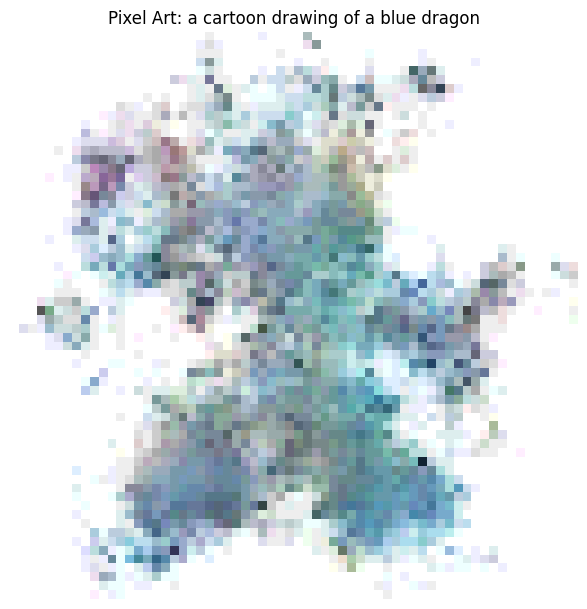

In [26]:
# Test del modello
test_text = "a cartoon drawing of a blue dragon"
result = test_generation(test_text, model)

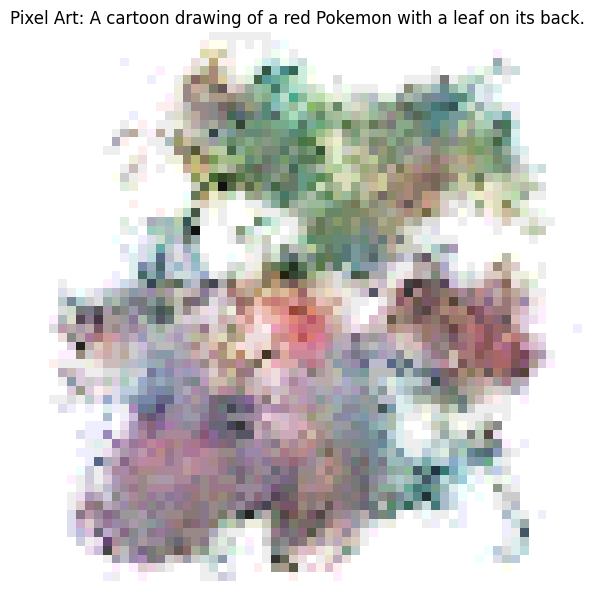

In [27]:
# Test del modello
test_text = "A cartoon drawing of a red Pokemon with a leaf on its back."
result = test_generation(test_text, model)